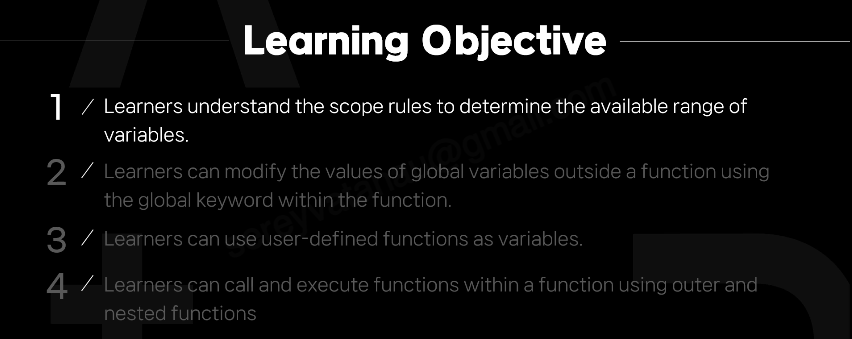

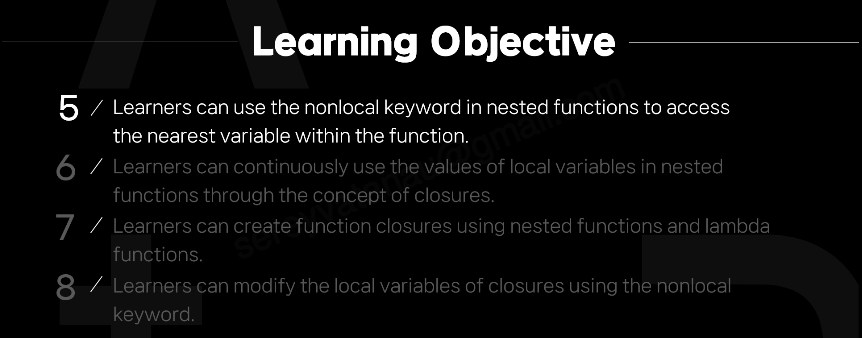

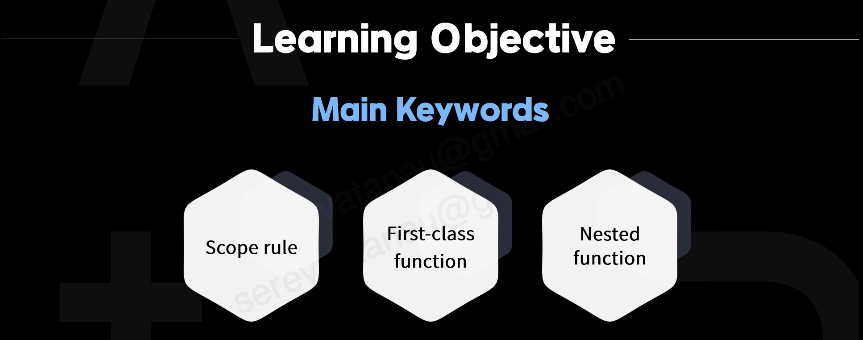

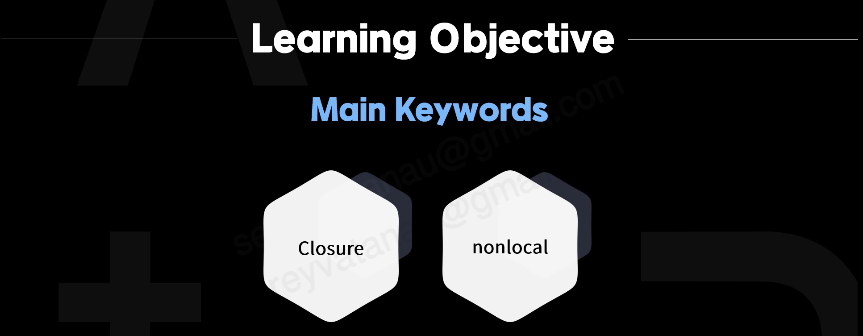

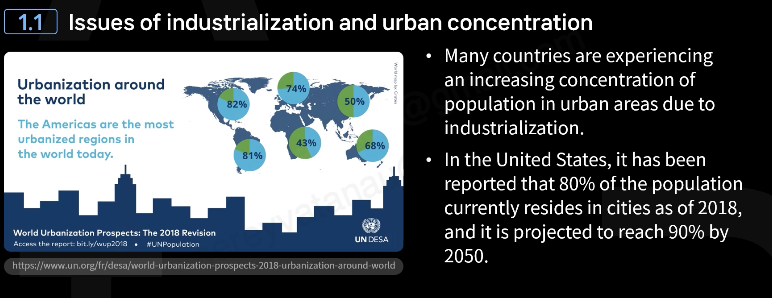

...

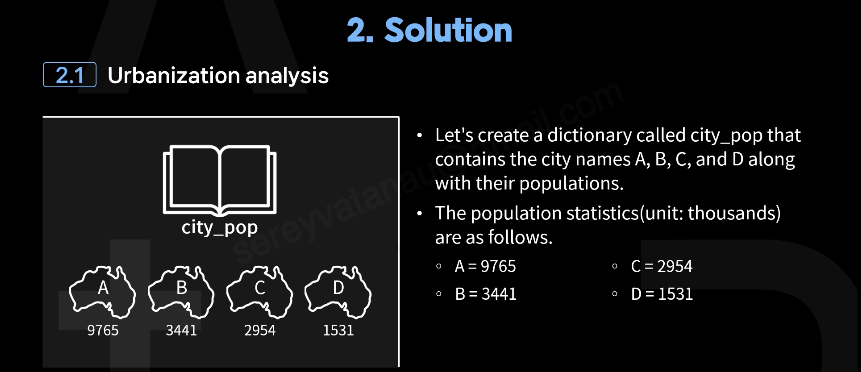

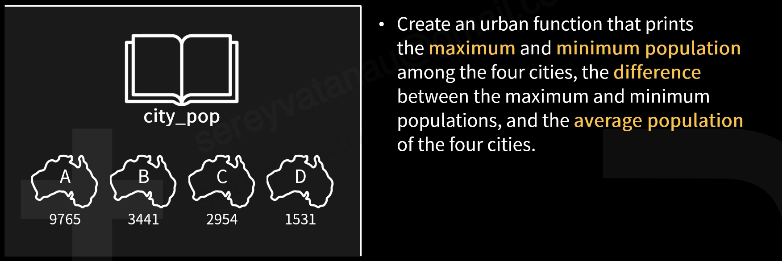

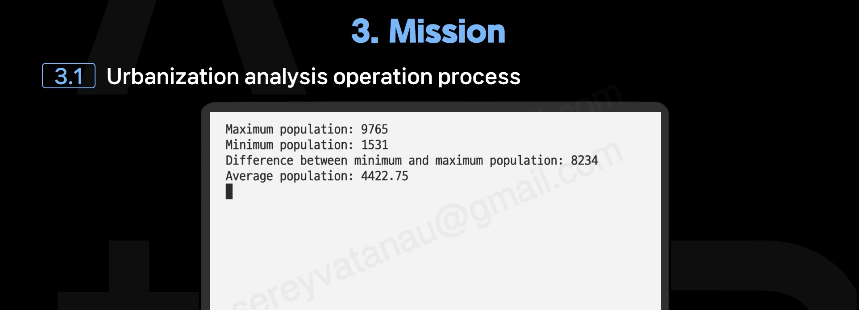

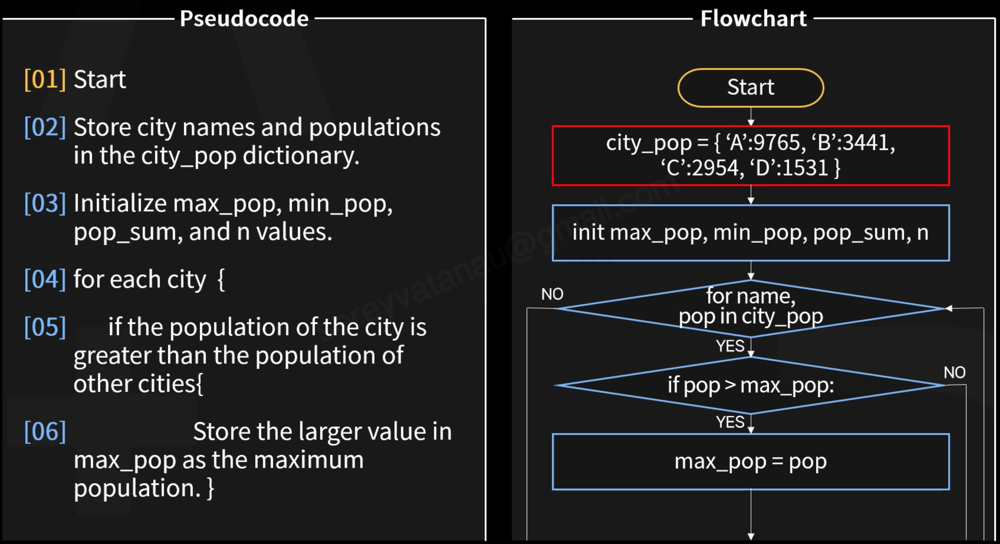

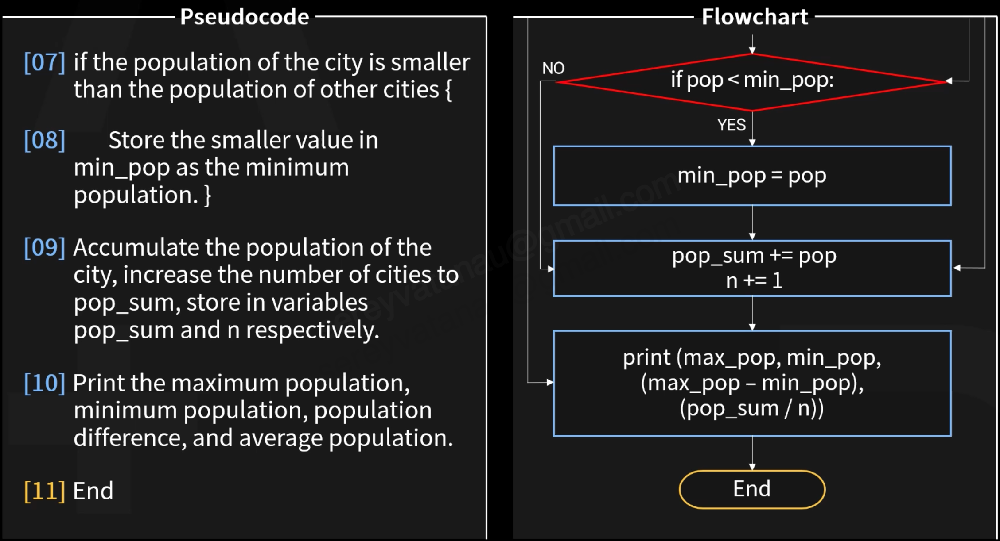

---

# <span style="color:red">Key Concept</span>

# 1. Scoping rule in Python

## 1.1 What is a scoping rule?

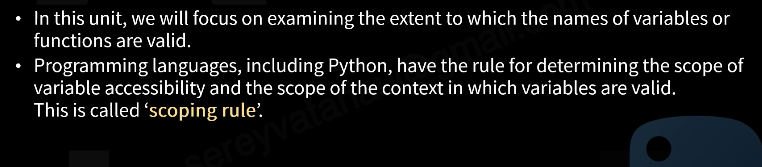

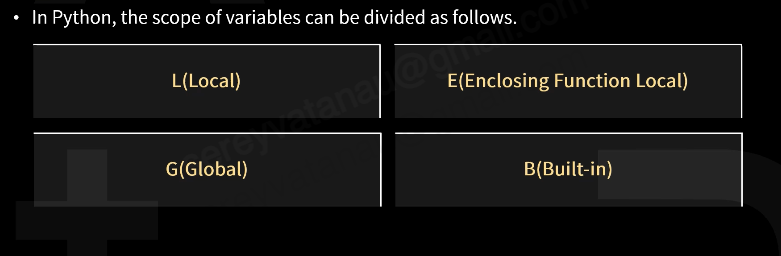

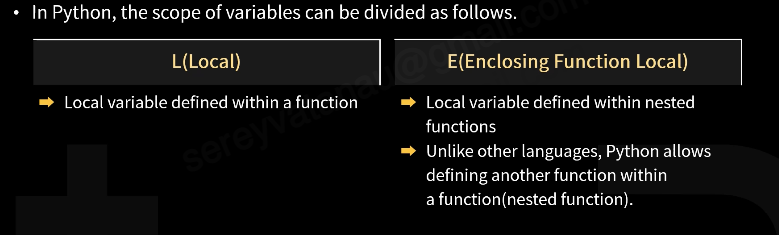

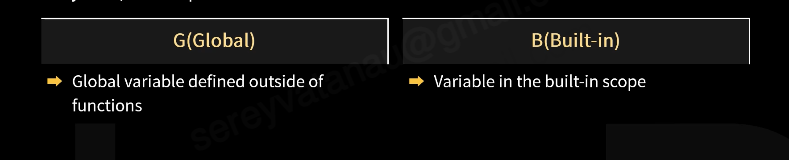

- When a variable is defined within a function, it becomes a local variable, and when it is defined outside of a function, it becomes a global variable.

- Let's examine the L, G, and E variables through

In [2]:
x = 10
y = 11
def foo() :
    x = 20 
    def bar() :
        a = 30 
        print(a, x, y)
    bar()
    x = 40
    bar()

foo()

30 20 11
30 40 11


- B, a variable in the built-in scope, is not in the code provided.

- Understanding the characteristics of these variables requires careful examination.

In [4]:
def print_counter() :
    counter = 200
    print('counter =', counter)
    
counter = 100
print_counter()
print('counter =', counter)

counter = 200
counter = 100


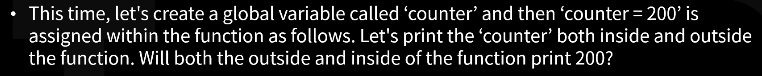

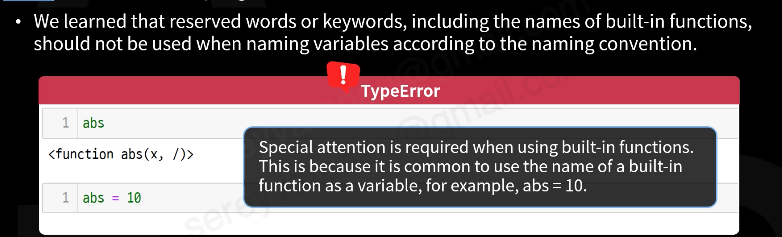

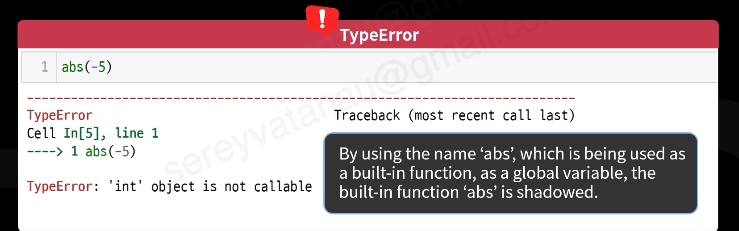

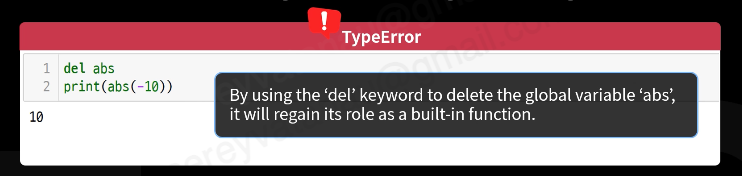

## 1.2 Local variables and global variables

- Let's compare local variables, which are variables within a function, with global variables that are used throughout the code.

In [5]:
def print_counter() :
    counter = 200
    print('counter =', counter)
    
counter = 100
print_counter()
print('counter =', counter)

counter = 200
counter = 100


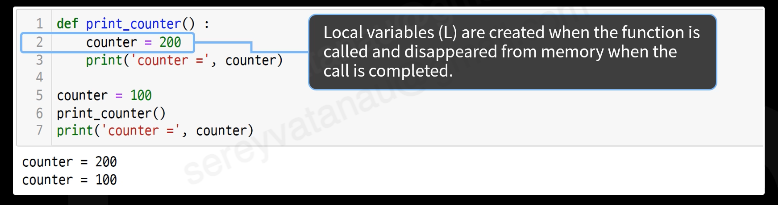

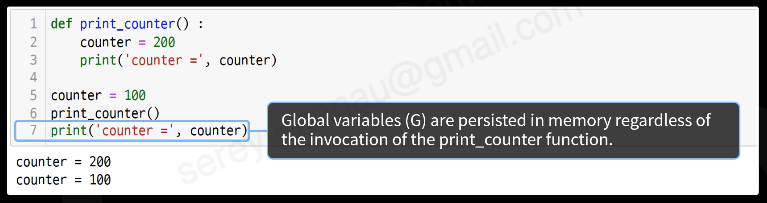

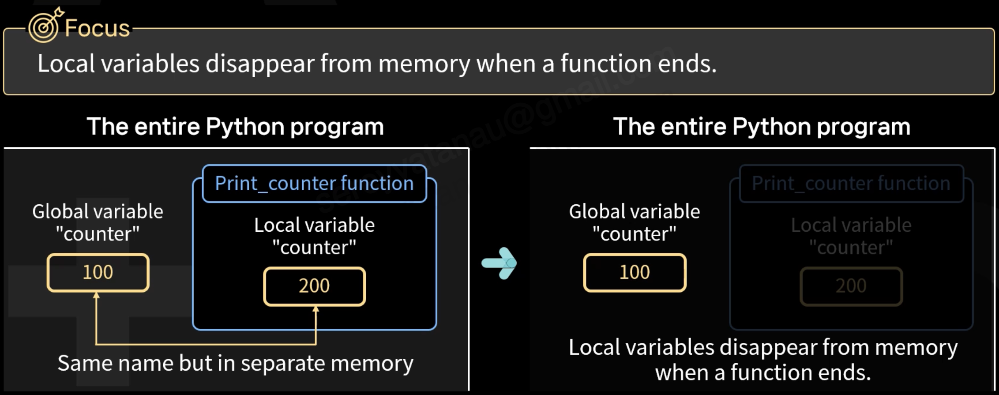

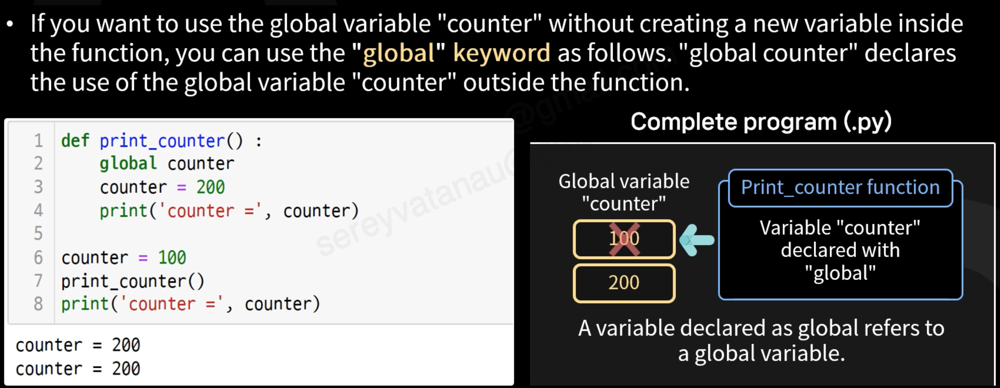

In [6]:
def print_counter() :
    global counter
    counter = 200
    print('counter =', counter)
    
counter = 100
print_counter()
print('counter =', counter)

counter = 200
counter = 200


--- 

# 2. First-class function

## 2.1 What is a first-class function?

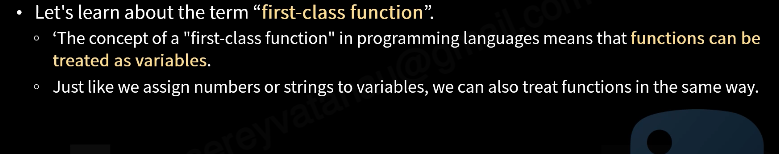

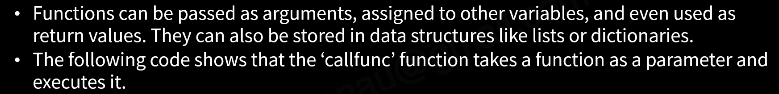

In [7]:
def callfunc(func) :
    func()
    
def greet() :
    print('Hello')
    
print('Calling the function callfunc(greet)')
callfunc(greet)

Calling the function callfunc(greet)
Hello


- line8: When calling the 'callfunc' function, the 'greet function' is passed as an argument.

### In Python, functions can be stored in lists and called using indexes, just like variables.

In [9]:
def plus(a, b) :
    return a + b

def minus(a, b) :
    return a - b

l_list = [plus, minus]
a = l_list[0](100, 200)
b = l_list[1](100, 200)

print('a =', a)
print('b =', b)

a = 300
b = -100


## 2.2 Advanced features implemented using first-class functions

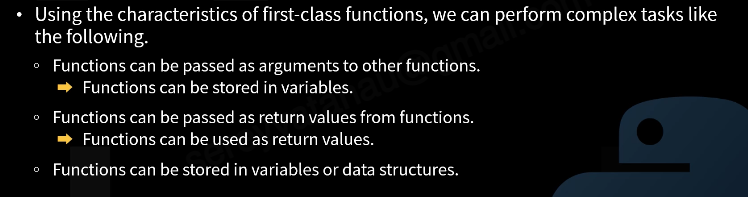

In [10]:
def add(a, b) :
    return a + b

def f(g, a, b) :
    return g(a, b)

f(add, 3, 4)

7

- The aiblity to use functions as arguments and return values in various forms is possible because all functions in Python are first-class functions.

---

# 3. Nested function

## 3.1 What is a nested function?

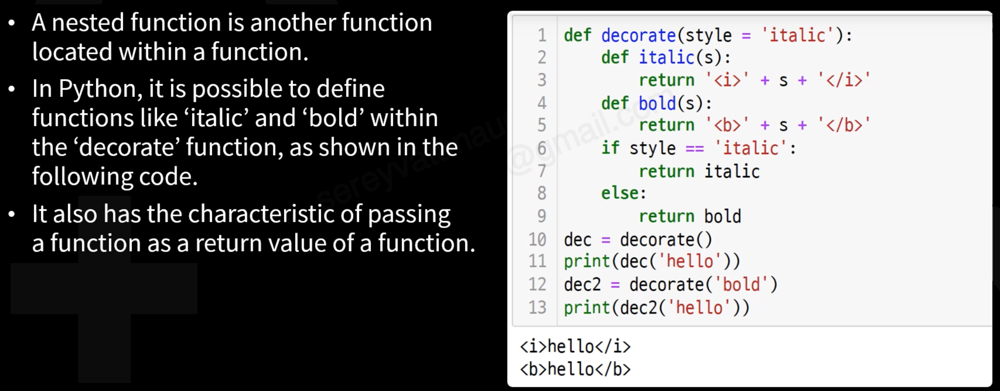

In [11]:
def decorate(style = 'italic') :
    def italic(s) :
        return '<i>' + s + '</i>'
    def bold(s) :
        return '<b>' + s + '</b>'
    
    if style == 'italic' :
        return italic
    else :
        return bold
    
dec = decorate()
print(dec('hello'))
dec2 = decorate('bold')
print(dec2('hello'))

<i>hello</i>
<b>hello</b>


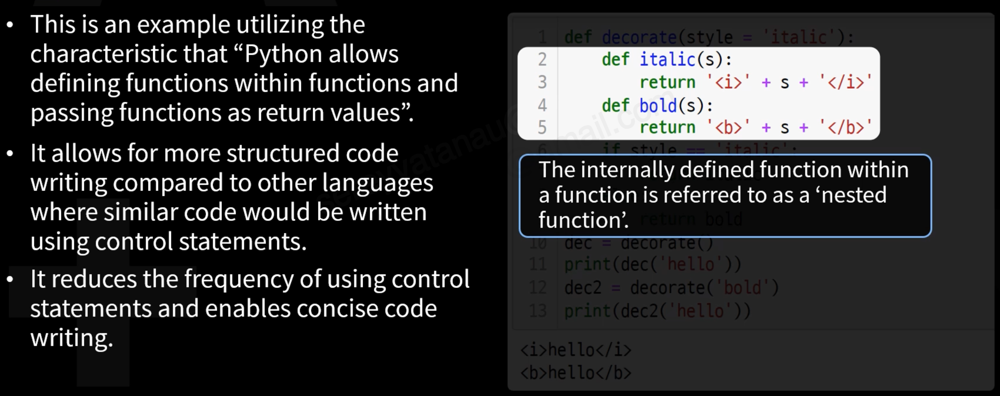

## 3.2 Reasons for using nested functions

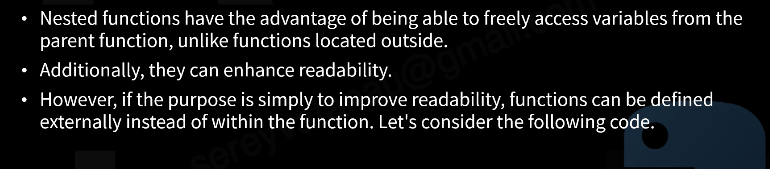

In [12]:
def another_func() :
    print('Hello')
    
def other_func() :
    return another_func()

other_func()

Hello


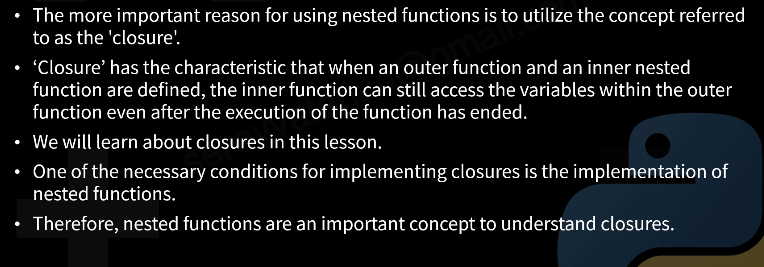

---

# 4. Nonlocal keyword

## 4.1 Global keyword and global variables

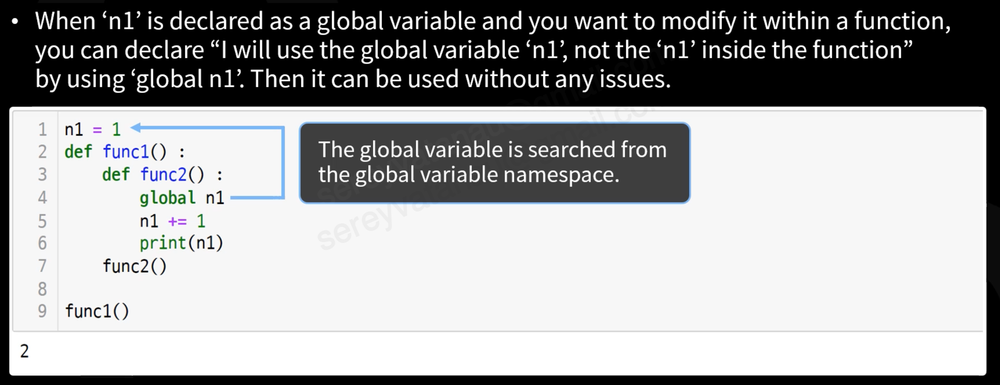

In [13]:
n1 = 1
def func1() :
    def func2() :
        global n1
        n1 += 1
        print(n1)
    func2()
    
func1()

2


## 4.2 Necessity of the nonlocal keyword

In [14]:
def func1() :
    n2 = 1
    def func2() :
        global n2
        n2 += 1
        print(n2)
    func2()
    
func1()

NameError: name 'n2' is not defined

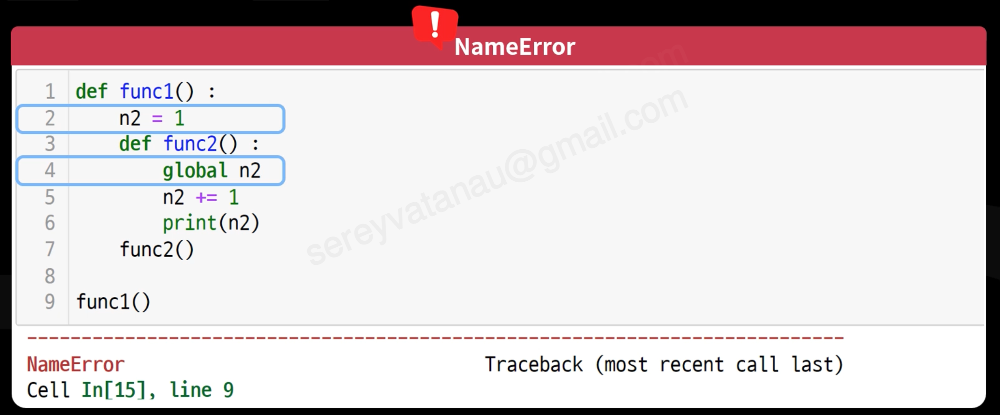

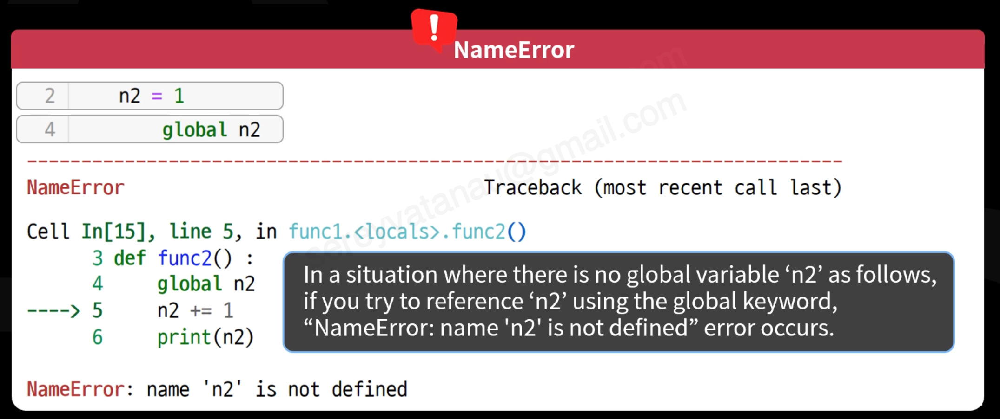

- In such cases, the <span style="color:orange">nonlocal keyword</span>, not the global keyword, should be used.

In [15]:
def func1() :
    n3 = 1
    def func2() :
        nonlocal n3
        n3 += 1
        print(n3) 
    func2()
    
func1()

2


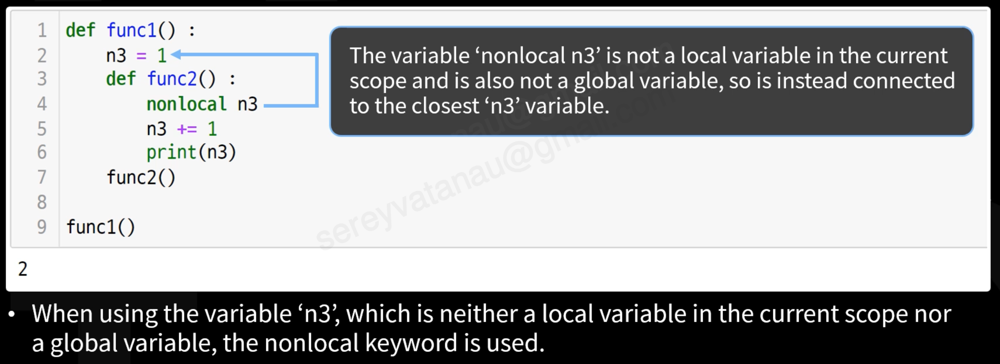

- By specifying 'nonlocal n3', it means "I will use the 'n3' variable defined in the closest scope that is not a local variable". In theis way, the 'n3' variable can be used without any issues.

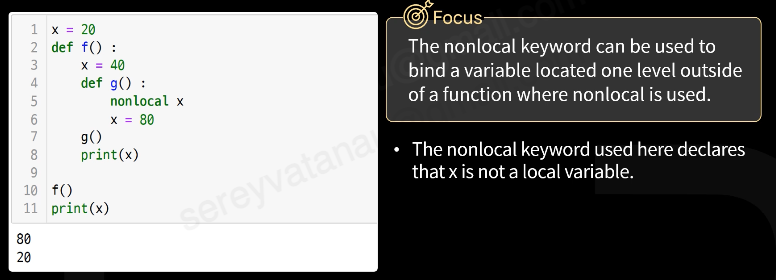

In [17]:
x = 20
def f() :
    x = 40 
    def g() :
        nonlocal x
        x = 80
    g()
    print(x)
    
f()
print(x)

80
20


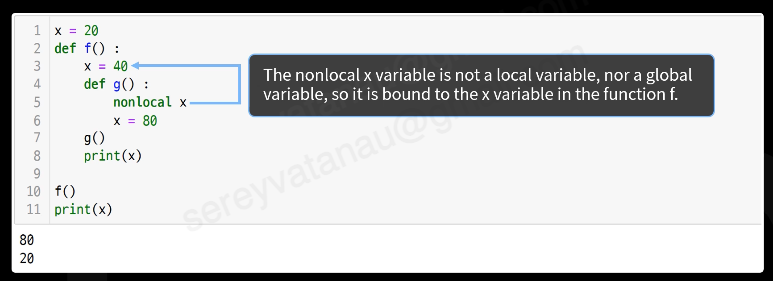

## 4.4 Relationship between nonlocal and global variables

- It is not allowed to define only one function and then use the non loval declaration to affect global variables.

In [18]:
x = 70
def f():
    nonlocal x
    x = 140
    
f()
print(x)

SyntaxError: no binding for nonlocal 'x' found (1448693925.py, line 3)

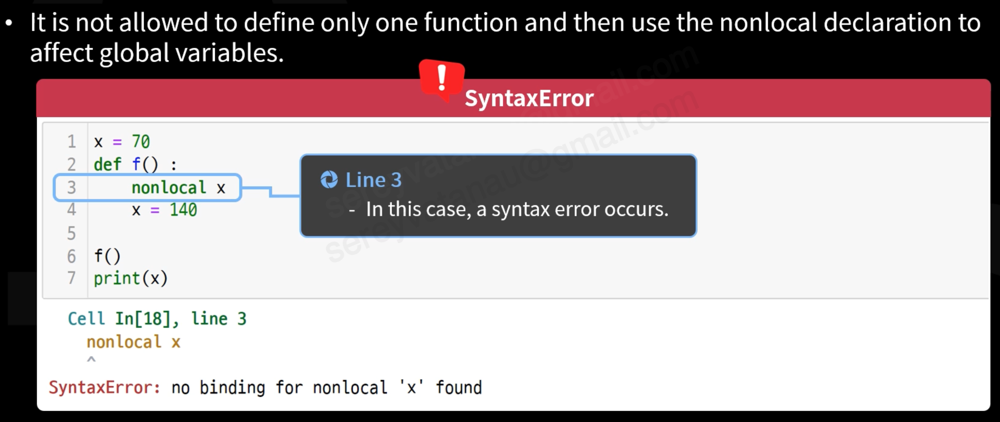

## 4.5 Order of searching for nonlocal variables

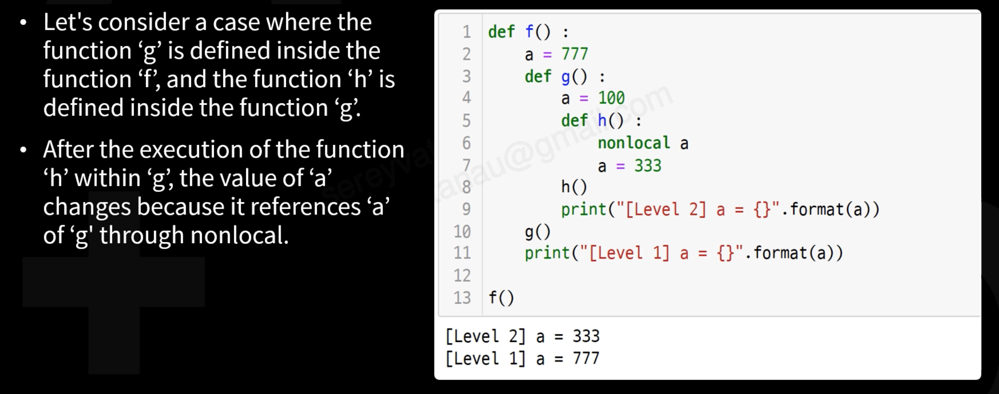

In [19]:
def f() :
    a = 777
    def g() :
        a = 100 
        def h() :
            nonlocal a
            a = 333
        h()
        print("[Level 2] a = {}".format(a))
    g()
    print("[Level 1] a = {}".format(a))
    
f()

[Level 2] a = 333
[Level 1] a = 777


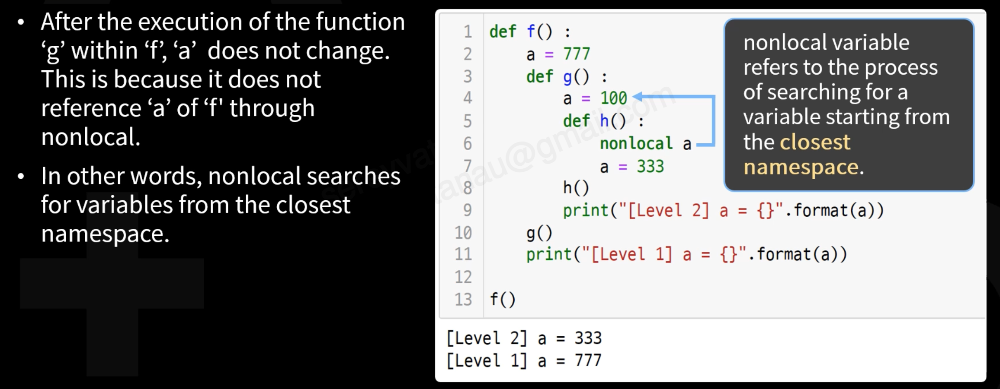

# 5. Closure

## 5.1 What is a closure?

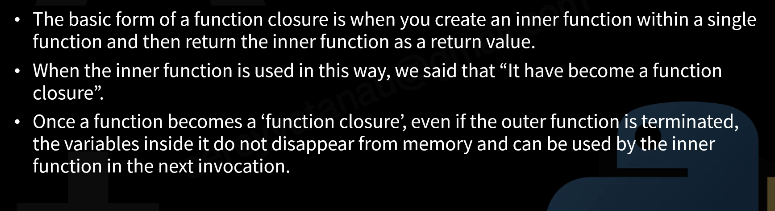

- Let's understand the concept of closure through the following simple code.

In [20]:
def clouser_calc() :
    a = 2
    def mult(x) :
        return a * x
    return mult

c = clouser_calc()
print(c(1), c(2), c(3))

2 4 6


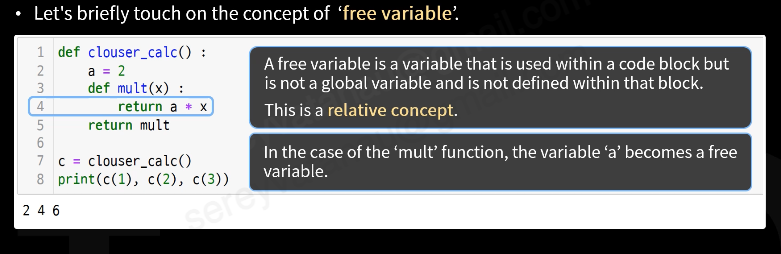

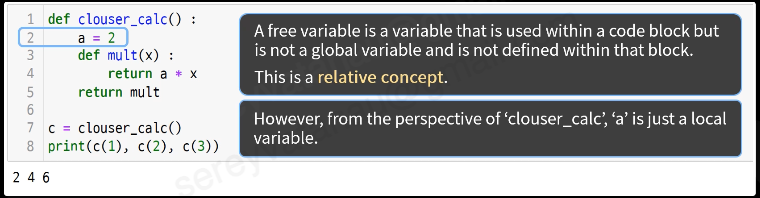

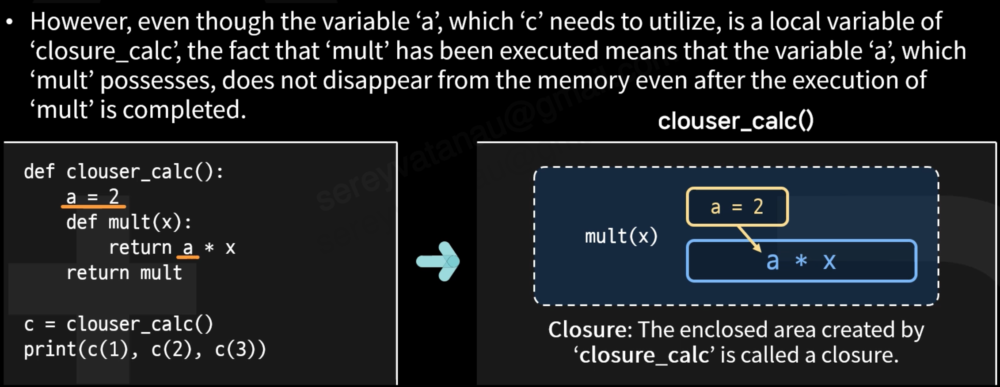

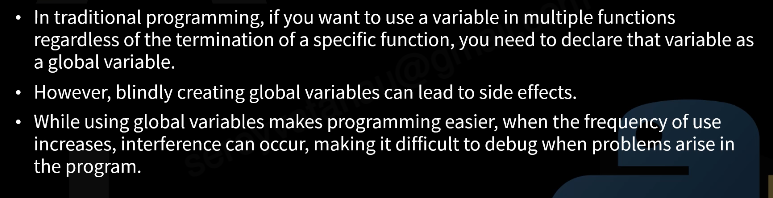

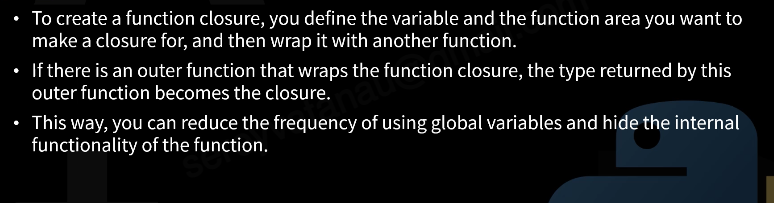

## 5.2 Main uses of closures

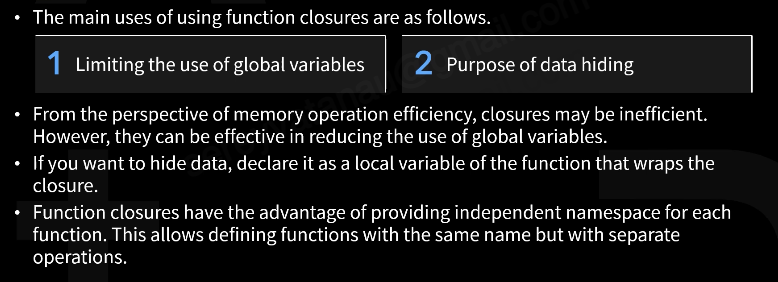

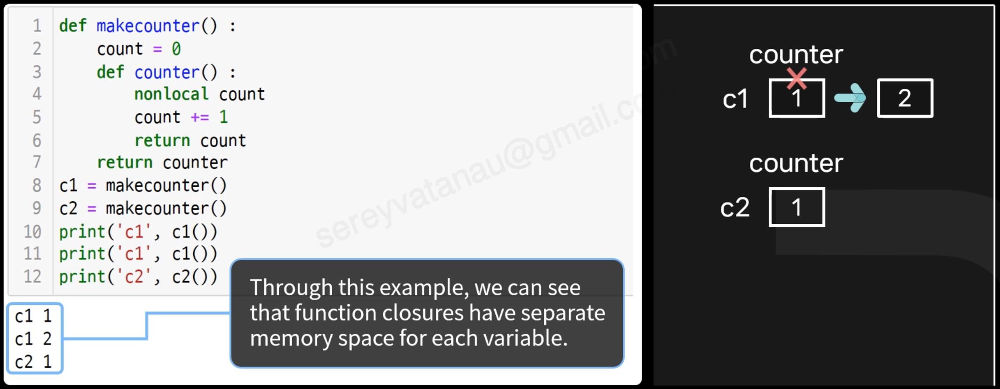

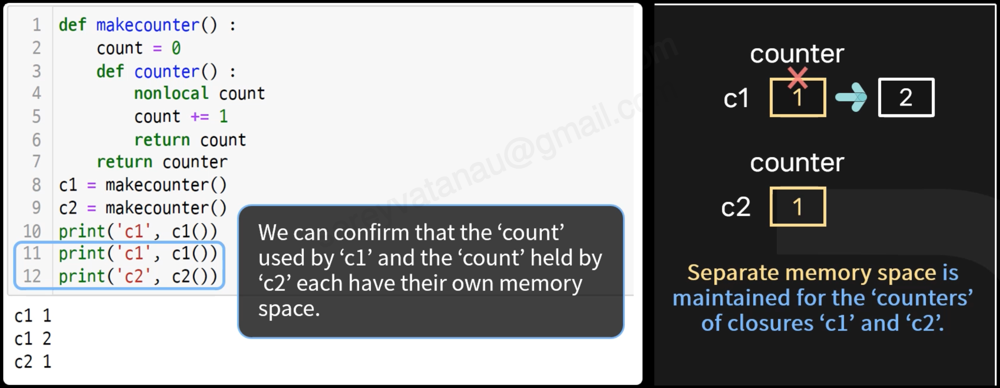

In [21]:
def makecounter() :
    count = 0
    def counter() :
        nonlocal count
        count += 1
        return count
    return counter
c1 = makecounter()
c2 = makecounter()
print('c1', c1())
print('c1', c1())
print('c2', c2())

c1 1
c1 2
c2 1


## 5.3 Approach 1 to create a clousure: nested functions

- The approach to creating a closure involves writing nested functions and returning the nested function.

In [22]:
def calc() :
    a = 3
    b = 5
    def mul_add(x) :
        return a * x + b
    return mul_add

c = calc()
print(c(1), c(2), c(3), c(4), c(5))

8 11 14 17 20


## 5.4 Approach 2 to create a closure: lambda

In [23]:
def clouser_calc() :
    a = 2
    b = 3
    return lambda x : a * x + b

c = clouser_calc()
print(c(1), c(2), c(3), c(4), c(5))

5 7 9 11 13


- The closure is created by returning the lambda expression itself, as in 'return lambda x: a * x + b'.

- Using lambda expressions makes closures simpler.

- Lambda expressions and closures are often used together, which can lead to confusion.

- Lambda refers to an anonoymous function without a name, while closure refers to a function that retains the enclosing environment and can be used later.

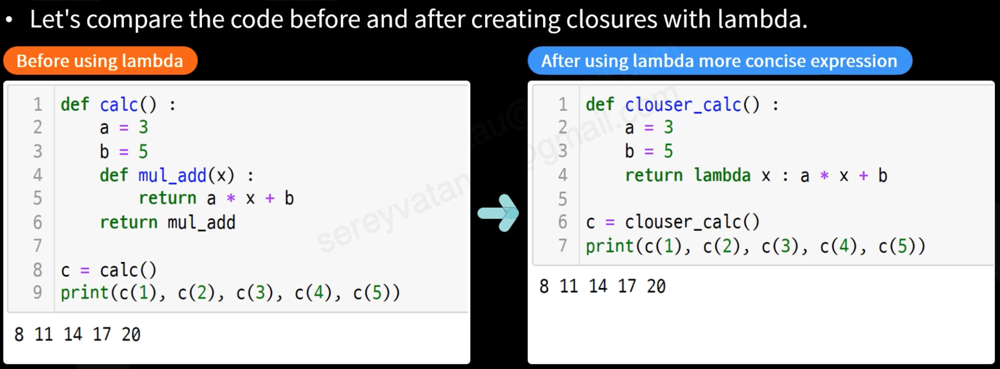

## 5.5 Modifying local variables in closures: nonlocal keyword

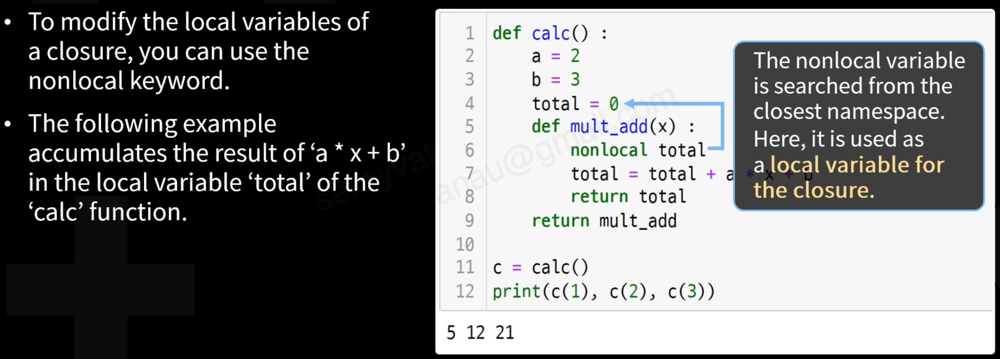

In [24]:
def calc() :
    a = 2
    b = 3
    total = 0
    def mult_add(x) :
        nonlocal total
        total = total + a * x + b
        return total 
    return mult_add

c = calc()
print(c(1), c(2), c(3))

5 12 21


---

# <span style="color:red">Paper Coding</span>

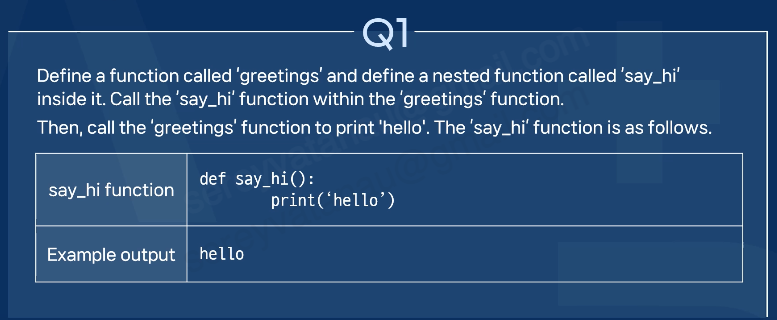

In [26]:
def greeting() :
    def say_hi() :
        print('hello')
    say_hi()
        
greeting()

hello


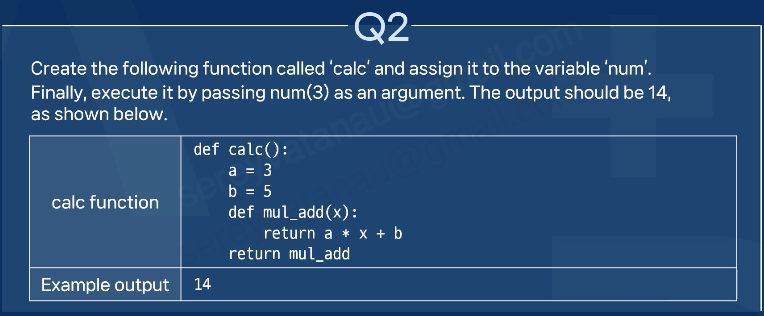

In [32]:
def calc() :
    a = 3
    b = 5
    def mul_add(x) :
        return a * x + b
    return mul_add

c = calc()
print(c(3))

14


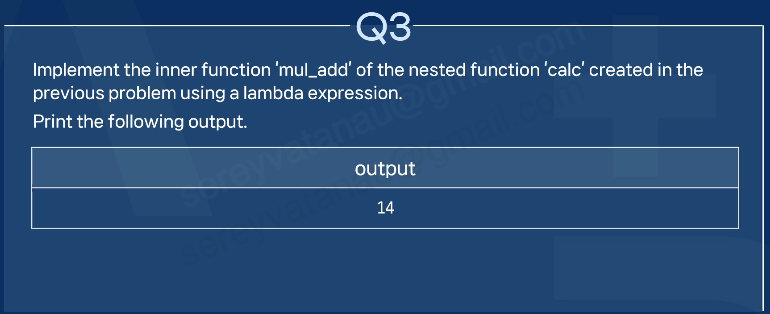

In [33]:
def calc() :
    a = 3
    b = 5
    return lambda x : a * x + b

c = calc()
print(c(3))

14


---

# <span style="color:red">Let's Code</span>

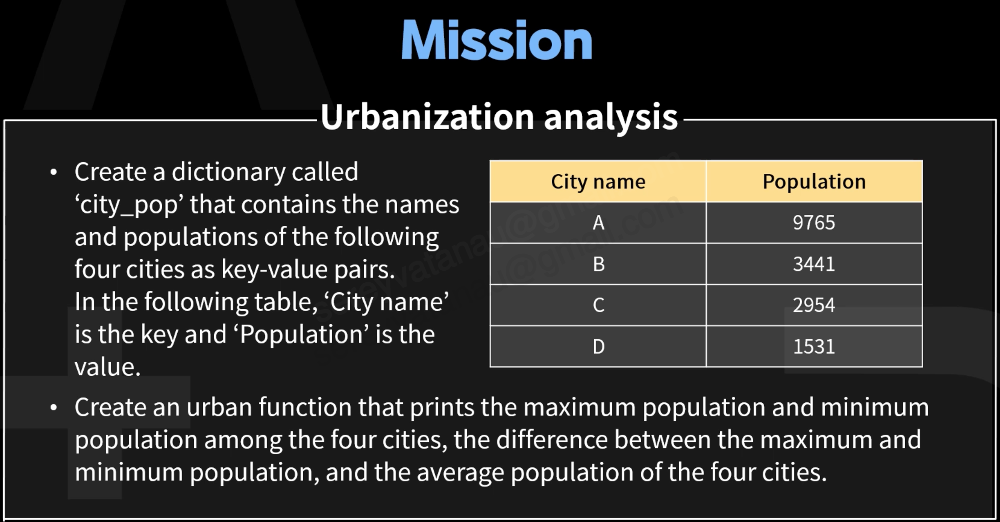

In [46]:
def urban() :
    max_pop = 0
    min_pop = 1000000
    pop_sum = 0
    n = 0
    def analyze(city) :
        nonlocal max_pop, min_pop, pop_sum, n
        print(max_pop, min_pop, pop_sum, n)
        for name, pop in city.items() :
            if pop > max_pop :
                max_pop = pop
            if pop < min_pop :
                min_pop = pop
            pop_sum += pop
            n += 1
        print(max_pop, min_pop, pop_sum, n)
        
        print("Maximum population :", max_pop)
        print("Minimum population :", min_pop)
        print("Difference between minimum and maximum population :", max_pop - min_pop)
        print("Average population :", pop_sum / n)
        
    return analyze


city_pop = {
    'A' : 9765,
    'B' : 3441,
    'C' : 2954,
    'D' : 1531,
}

urban_analyzer = urban()
urban_analyzer(city_pop)


0 1000000 0 0
9765 1531 17691 4
Maximum population : 9765
Minimum population : 1531
Difference between minimum and maximum population : 8234
Average population : 4422.75


---

# <span style="color:red">Pair Programming</span>

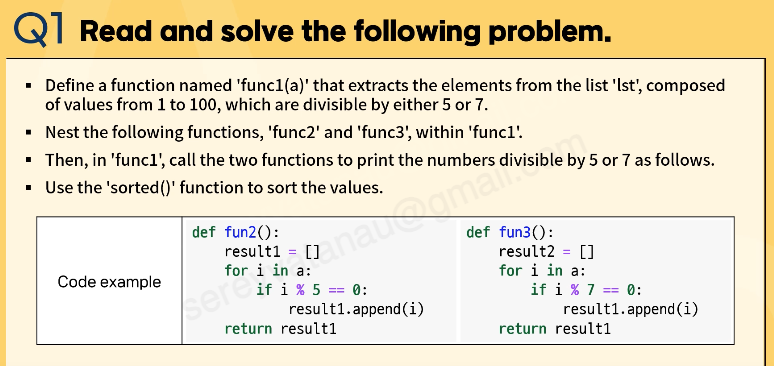

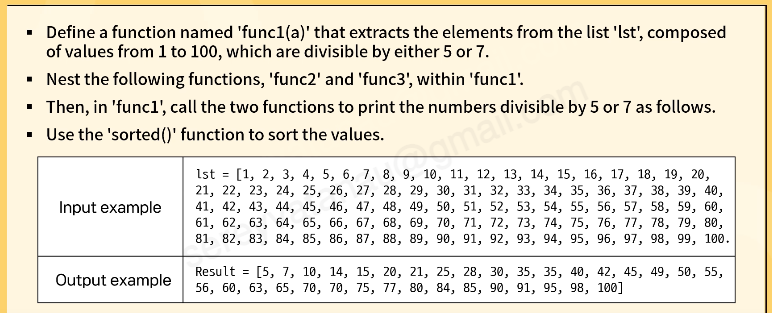

In [112]:
def func1(a) :  
    def fun2() :
        result1 = []
        for i in a :
            if i % 5 == 0 :
                result1.append(i)
        return result1
                
    def fun3() :
        result2 = []
        for i in a :
            if i % 7 == 0 :
                result2.append(i)
        return result2
      
    return sorted(set(fun2()) | set(fun3()))

lst = list(map(lambda x: x, range(1,101)))
print('lst =', lst)

result = func1(lst)

print('Result =', result)

lst = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
Result = [5, 7, 10, 14, 15, 20, 21, 25, 28, 30, 35, 40, 42, 45, 49, 50, 55, 56, 60, 63, 65, 70, 75, 77, 80, 84, 85, 90, 91, 95, 98, 100]


<span style="color:red"></span>